# Reactive covering

## Introduction

EXPLAIN

In [42]:
from matplotlib import pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cf
import math
from docplex.mp.model import Model

import random
import json

def showSolution(data,solution):
    
    # print the booking strategy
    print("Bookings:")
    for booking in solution['Bookings']:
        print(booking)

    # show the passes
    minVisiDuration = data['minVisiDuration']
    AOIs = data['AOIs']
    nAOIs = len(AOIs)
    accesses = data['Accesses']
    satPasses = data['Passes']
    nPasses = len(satPasses)
    
    ncols = 3
    nrows = math.ceil(nPasses / ncols)
    proj = ccrs.PlateCarree()
    fig, axs = plt.subplots(nrows=nrows,ncols=ncols, subplot_kw={'projection': proj},figsize=(30,80))
    axs = axs.flatten()

    for i in range(nPasses):
        satPass = satPasses[i]
        ax = axs[i]
        ax.set_extent([-15, 25, 35, 60])
        ax.stock_img()
        ax.add_feature(cf.COASTLINE, lw=1)
        ax.add_feature(cf.BORDERS)
        #plt.gcf().set_size_inches(15, 15)    
        for aoi in  AOIs:
            ax.plot([aoi['lon']], [aoi['lat']], 'kx')
        ax.set_title("Pass #{} [{},{}]".format(i,satPass['startDate'],satPass['endDate']))
    
        booking = None
        for bk in solution['Bookings']:
            if bk['passId'] == i:
                booking = bk            
                break
        
        for accessId in satPass['accessIds']:
            access = accesses[accessId]
            aoi = AOIs[access['aoiId']]            
            ax.plot([aoi['lon']], [aoi['lat']], 'rx')
            # show the reservations
            if (booking != None) and (booking['bookingStart'] <= access['end'] - minVisiDuration) and (access['start'] + minVisiDuration <= booking['bookingEnd']):
                ax.plot([aoi['lon']], [aoi['lat']], 'bo')

    plt.show()

## Stage 1

Explicar como hemos calculado el coste y como hemos definido la quality y meter un poco de paja rollo intro

In [9]:
# Import the data
dataFile = open('data/data4.json')  
data = json.load(dataFile)

# Load data
obsRequests = data['ObservationRequests']
fixedPassCost = data['fixedPassCost']
minVisiDuration = data['minVisiDuration']
aois = data['AOIs']
accesses = data['Accesses']
referenceDate = data['referenceDate']
passCostPerTimeUnit = data['passCostPerTimeUnit']
goals = data['Goals']
satPasses = data['Passes']

# Lengths of lists
nAois = len(aois)
nObsRequests = len(obsRequests)
nObsRequestsToCover = nObsRequests
nPasses = len(satPasses)
nGoals = len(goals)

# Very basic solver
# We start considering all the AOIs uncovered
covered = [False for i in range(nObsRequests)]
remainingSatPassesIds = list(range(nPasses))
random.shuffle(remainingSatPassesIds)
selectedPassIds = []
for i in remainingSatPassesIds:
    # Try to select the ith path
    satPass = satPasses[i]
    keepPass = False
    for accessId in satPass['accessIds']:
        access = accesses[accessId]
        for j in range(nObsRequests):
            obsRequest = obsRequests[j]
            if not covered[j] and accessId in obsRequest['accessIds']:
                covered[j] = True
                keepPass = True
                nObsRequestsToCover -= 1
                
    if keepPass:
        selectedPassIds.append(i)
            
    if nObsRequestsToCover == 0:
        break

# Computation of the total cost
timeUses = [satPasses[id]['end'] - satPasses[id]['start'] for id in selectedPassIds]
totalCost = len(selectedPassIds)*data['fixedPassCost'] + sum(timeUses)*data['passCostPerTimeUnit']

# Computation of the quality of the covering: It is defined as the relation of the 
# requests covered over the total amount of requests
quality = 0
for aoiId in range(nAois):
    aux = 0
    for goalId in range(nGoals):
        for step in range(goals[goalId]['nSteps']):
            obsReqId = aoiId + nAois*aux + step + (goals[goalId]['nSteps'] - 1)*aoiId
            requestStart = step*goals[goalId]['duStep']
            requestEnd = step*goals[goalId]['duStep'] + goals[goalId]['rctHorizon']
            for passId in selectedPassIds:
                if any(accessIdObsReq in satPasses[passId]['accessIds'] for accessIdObsReq in obsRequests[obsReqId]['accessIds']):
                    if requestStart<=satPasses[passId]['start'] and requestEnd>=satPasses[passId]['end']:
                        quality +=1
                        break
        aux += goals[goalId]['nSteps']
        
quality /= nObsRequests

# Presentation of the results
print("IDs of the {0} selected passes: {1}".format(len(selectedPassIds), selectedPassIds))
print("Total cost of the covering: {0}".format(totalCost))
print("Quality of the covering: {0}".format(quality))

# Export the solution to json
bookings = []
for i in selectedPassIds:
    satPass = satPasses[i]
    bookings.append({"passId": i, "passStart": satPass['start'], "passEnd": satPass['end'], "bookingStart": satPass['start'], "bookingEnd": satPass['end']})
jsonString = json.dumps({"Bookings": bookings})
jsonFile = open("mySolution.json", "w")
jsonFile.write(jsonString)
jsonFile.close()

IDs of the 45 selected passes: [63, 58, 68, 8, 49, 45, 10, 52, 7, 14, 36, 6, 15, 53, 5, 21, 67, 22, 20, 38, 40, 24, 56, 9, 33, 32, 18, 47, 13, 42, 48, 37, 39, 29, 46, 34, 26, 30, 17, 61, 2, 66, 25, 51, 62]
Total cost of the covering: 15798
Quality of the covering: 0.9924444444444445


Bookings:
{'passId': 42, 'passStart': 27842, 'passEnd': 28123, 'bookingStart': 27842, 'bookingEnd': 28123}
{'passId': 10, 'passStart': 6617, 'passEnd': 6964, 'bookingStart': 6617, 'bookingEnd': 6964}
{'passId': 11, 'passStart': 7138, 'passEnd': 7246, 'bookingStart': 7138, 'bookingEnd': 7246}
{'passId': 35, 'passStart': 23681, 'passEnd': 23762, 'bookingStart': 23681, 'bookingEnd': 23762}
{'passId': 65, 'passStart': 41141, 'passEnd': 41216, 'bookingStart': 41141, 'bookingEnd': 41216}
{'passId': 9, 'passStart': 5777, 'passEnd': 6101, 'bookingStart': 5777, 'bookingEnd': 6101}
{'passId': 55, 'passStart': 35635, 'passEnd': 35701, 'bookingStart': 35635, 'bookingEnd': 35701}
{'passId': 32, 'passStart': 21960, 'passEnd': 22144, 'bookingStart': 21960, 'bookingEnd': 22144}
{'passId': 17, 'passStart': 11293, 'passEnd': 11607, 'bookingStart': 11293, 'bookingEnd': 11607}
{'passId': 23, 'passStart': 15174, 'passEnd': 15412, 'bookingStart': 15174, 'bookingEnd': 15412}
{'passId': 40, 'passStart': 26206

/usr/local/anaconda3.9/envs/complex20-pro/lib/python3.8/site-packages/cartopy/io/__init__.py:260: DownloadWarning: Downloading: https://naciscdn.org/naturalearth/50m/physical/ne_50m_coastline.zip
  warnings.warn('Downloading: {}'.format(url), DownloadWarning)
/usr/local/anaconda3.9/envs/complex20-pro/lib/python3.8/site-packages/cartopy/io/__init__.py:260: DownloadWarning: Downloading: https://naciscdn.org/naturalearth/50m/cultural/ne_50m_admin_0_boundary_lines_land.zip
  warnings.warn('Downloading: {}'.format(url), DownloadWarning)


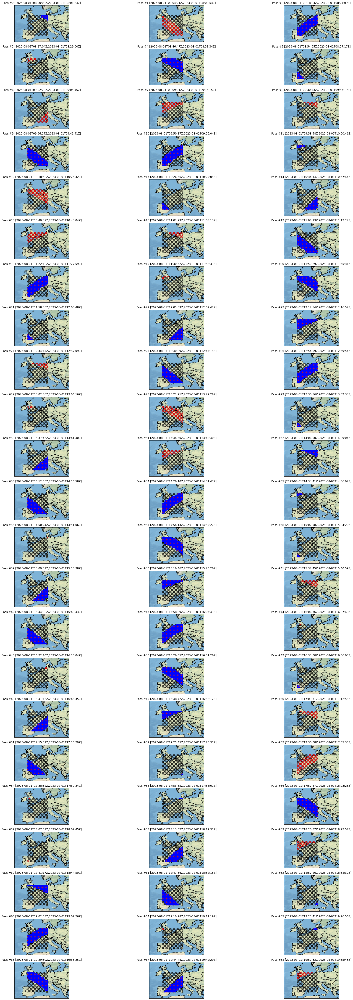

In [3]:
# import the solution
solutionFile = open('mySolution.json')  
solution = json.load(solutionFile)

showSolution(data,solution)

## Stage 2

EXPLAIN

In [125]:
# Import the data
dataFile = open('data/data4.json')  
data = json.load(dataFile)

# Load data
obsRequests = data['ObservationRequests']
fixedPassCost = data['fixedPassCost']
minVisiDuration = data['minVisiDuration']
aois = data['AOIs']
accesses = data['Accesses']
referenceDate = data['referenceDate']
passCostPerTimeUnit = data['passCostPerTimeUnit']
goals = data['Goals']
satPasses = data['Passes']

# Lengths of lists
nAois = len(aois)
nObsRequests = len(obsRequests)
nPasses = len(satPasses)
nGoals = len(goals)

# OPTIMISATION MODEL
# Model creation
model = Model("reactiveCovering")

# Variables
selectedPass = model.binary_var_list(range(nPasses), name='selectedPass')

# Objectif:
# 1) Minimisation of the cost
model.minimize(model.sum(selectedPass)*data['fixedPassCost']
    + model.sum((satPasses[id]['end'] - satPasses[id]['start'])*selectedPass[id] 
    for id in range(nPasses))*data['passCostPerTimeUnit'])

# Contraints:
# 1) Ensuring that all the goals are covered bu at least one access of a pass
def covering(requestStart, requestEnd, passId, obsReqId):
    if any(accessIdObsReq in satPasses[passId]['accessIds'] for accessIdObsReq in obsRequests[obsReqId]['accessIds']):
        print('Access of the observation request in the pass {0}'.format(passId))
        #if requestStart<=satPasses[passId]['start'] and requestEnd>=satPasses[passId]['end']:
        if requestStart<=(satPasses[passId]['end'] - 30) and requestEnd>=(satPasses[passId]['start'] + 30):
            print('The pass covers the request during its duration')
            return selectedPass[passId]
    return 0

# Checking for all the observation requests
for aoiId in range(nAois):
    aux = 0
    for goalId in range(nGoals):
        for step in range(goals[goalId]['nSteps']):
            obsReqId = aoiId + nAois*aux + step + (goals[goalId]['nSteps'] - 1)*aoiId
            requestStart = step*goals[goalId]['duStep']
            requestEnd = step*goals[goalId]['duStep'] + goals[goalId]['rctHorizon']
            print('Observation request ID:{0} for the Aoi {1} and the step {2} goal {3}'.format(obsReqId, aoiId, step, goalId))
            print('Aoi {0}'.format(obsRequests[obsReqId]['aoiId']))
            print('Goal of the observation request:' + str(obsRequests[obsReqId]['goalId']))
            print('Step of the goal:' + str(step) + ' Starting @ ' + str(requestStart) + ' Ending @ ' +  str(requestEnd))
            coverings = [covering(requestStart, requestEnd, passId, obsReqId) for passId in range(nPasses)]
            sum_covering = model.sum(coverings)
            if not str(sum_covering) == "0":
                model.add_constraint(sum_covering >= 1)
            print('----------------------------------------------------------------------')
        aux += goals[goalId]['nSteps']

# Solve:
# Computation time limit
model.set_time_limit(300)

model.print_information()

# Call of the solver
solution = model.solve(log_output=True)

# Getting the solution
selectedPassIds = []
if solution is None:
    raise Exception("No solution")
else:
    for i in range(nPasses):
        if selectedPass[i].solution_value == 1:
            selectedPassIds.append(i)

print('______________________________________________')
# Computation of the total cost
timeUses = [satPasses[id]['end'] - satPasses[id]['start'] for id in selectedPassIds]
totalCost = len(selectedPassIds)*data['fixedPassCost'] + sum(timeUses)*data['passCostPerTimeUnit']

# Computation of the quality of the covering: It is defined as the relation of the 
# requests covered over the total amount of requests
quality = 0
for aoiId in range(nAois):
    aux = 0
    for goalId in range(nGoals):
        for step in range(goals[goalId]['nSteps']):
            obsReqId = aoiId + nAois*aux + step + (goals[goalId]['nSteps'] - 1)*aoiId
            requestStart = step*goals[goalId]['duStep']
            requestEnd = step*goals[goalId]['duStep'] + goals[goalId]['rctHorizon']
            for passId in selectedPassIds:
                if any(accessIdObsReq in satPasses[passId]['accessIds'] for accessIdObsReq in obsRequests[obsReqId]['accessIds']):
                    if requestStart<=satPasses[passId]['start'] and requestEnd>=satPasses[passId]['end']:
                        quality +=1
                        break
        aux += goals[goalId]['nSteps']
        
quality /= nObsRequests

# Presentation of the results
print("IDs of the {0} selected passes: {1}".format(len(selectedPassIds), selectedPassIds))
print("Total cost of the covering: {0}".format(totalCost))
print("Quality of the covering: {0}".format(quality))

# Export the solution to json
bookings = []
for i in selectedPassIds:
    satPass = satPasses[i]
    bookings.append({"passId": i, "passStart": satPass['start'], "passEnd": satPass['end'], "bookingStart": satPass['start'], "bookingEnd": satPass['end']})
jsonString = json.dumps({"Bookings": bookings})
jsonFile = open("mySolution.json", "w")
jsonFile.write(jsonString)
jsonFile.close()
 

Observation request ID:0 for the Aoi 0 and the step 0 goal 0
Aoi 0
Goal of the observation request:0
Step of the goal:0 Starting @ 0 Ending @ 43200
Access of the observation request in the pass 2
The pass covers the request during its duration
Access of the observation request in the pass 5
The pass covers the request during its duration
Access of the observation request in the pass 10
The pass covers the request during its duration
Access of the observation request in the pass 13
The pass covers the request during its duration
Access of the observation request in the pass 18
The pass covers the request during its duration
Access of the observation request in the pass 21
The pass covers the request during its duration
Access of the observation request in the pass 26
The pass covers the request during its duration
Access of the observation request in the pass 29
The pass covers the request during its duration
Access of the observation request in the pass 34
The pass covers the request d

----------------------------------------------------------------------
Observation request ID:419 for the Aoi 21 and the step 5 goal 1
Aoi 21
Goal of the observation request:1
Step of the goal:5 Starting @ 18000 Ending @ 32400
Access of the observation request in the pass 33
The pass covers the request during its duration
Access of the observation request in the pass 34
The pass covers the request during its duration
Access of the observation request in the pass 42
The pass covers the request during its duration
Access of the observation request in the pass 43
The pass covers the request during its duration
----------------------------------------------------------------------
Observation request ID:420 for the Aoi 21 and the step 6 goal 1
Aoi 21
Goal of the observation request:1
Step of the goal:6 Starting @ 21600 Ending @ 36000
Access of the observation request in the pass 33
The pass covers the request during its duration
Access of the observation request in the pass 34
The pass cov

Access of the observation request in the pass 31
The pass covers the request during its duration
Access of the observation request in the pass 37
The pass covers the request during its duration
Access of the observation request in the pass 40
The pass covers the request during its duration
Access of the observation request in the pass 46
The pass covers the request during its duration
Access of the observation request in the pass 49
The pass covers the request during its duration
----------------------------------------------------------------------
Observation request ID:609 for the Aoi 42 and the step 6 goal 1
Aoi 42
Goal of the observation request:1
Step of the goal:6 Starting @ 21600 Ending @ 36000
Access of the observation request in the pass 37
The pass covers the request during its duration
Access of the observation request in the pass 40
The pass covers the request during its duration
Access of the observation request in the pass 46
The pass covers the request during its durati

The pass covers the request during its duration
Access of the observation request in the pass 18
The pass covers the request during its duration
Access of the observation request in the pass 25
The pass covers the request during its duration
Access of the observation request in the pass 26
The pass covers the request during its duration
Access of the observation request in the pass 33
The pass covers the request during its duration
Access of the observation request in the pass 34
The pass covers the request during its duration
----------------------------------------------------------------------
Observation request ID:814 for the Aoi 65 and the step 4 goal 1
Aoi 65
Goal of the observation request:1
Step of the goal:4 Starting @ 14400 Ending @ 28800
Access of the observation request in the pass 25
The pass covers the request during its duration
Access of the observation request in the pass 26
The pass covers the request during its duration
Access of the observation request in the pass 

Access of the observation request in the pass 46
The pass covers the request during its duration
Access of the observation request in the pass 49
The pass covers the request during its duration
Access of the observation request in the pass 53
The pass covers the request during its duration
Access of the observation request in the pass 56
The pass covers the request during its duration
Access of the observation request in the pass 59
The pass covers the request during its duration
Access of the observation request in the pass 63
The pass covers the request during its duration
Access of the observation request in the pass 66
The pass covers the request during its duration
Access of the observation request in the pass 68
The pass covers the request during its duration
----------------------------------------------------------------------
Observation request ID:88 for the Aoi 88 and the step 0 goal 0
Aoi 88
Goal of the observation request:0
Step of the goal:0 Starting @ 0 Ending @ 43200
Ac

----------------------------------------------------------------------
Observation request ID:1199 for the Aoi 108 and the step 2 goal 1
Aoi 108
Goal of the observation request:1
Step of the goal:2 Starting @ 7200 Ending @ 21600
Access of the observation request in the pass 17
The pass covers the request during its duration
Access of the observation request in the pass 25
The pass covers the request during its duration
Access of the observation request in the pass 30
The pass covers the request during its duration
----------------------------------------------------------------------
Observation request ID:1200 for the Aoi 108 and the step 3 goal 1
Aoi 108
Goal of the observation request:1
Step of the goal:3 Starting @ 10800 Ending @ 25200
Access of the observation request in the pass 17
The pass covers the request during its duration
Access of the observation request in the pass 25
The pass covers the request during its duration
Access of the observation request in the pass 30
The pas

Access of the observation request in the pass 43
The pass covers the request during its duration
Access of the observation request in the pass 46
The pass covers the request during its duration
Access of the observation request in the pass 53
The pass covers the request during its duration
Access of the observation request in the pass 56
The pass covers the request during its duration
----------------------------------------------------------------------
Observation request ID:1385 for the Aoi 128 and the step 8 goal 1
Aoi 128
Goal of the observation request:1
Step of the goal:8 Starting @ 28800 Ending @ 43200
Access of the observation request in the pass 43
The pass covers the request during its duration
Access of the observation request in the pass 46
The pass covers the request during its duration
Access of the observation request in the pass 53
The pass covers the request during its duration
Access of the observation request in the pass 56
The pass covers the request during its dur

Access of the observation request in the pass 40
The pass covers the request during its duration
Access of the observation request in the pass 41
The pass covers the request during its duration
Access of the observation request in the pass 43
The pass covers the request during its duration
Access of the observation request in the pass 49
The pass covers the request during its duration
Access of the observation request in the pass 50
The pass covers the request during its duration
Access of the observation request in the pass 53
The pass covers the request during its duration
----------------------------------------------------------------------
Observation request ID:1564 for the Aoi 148 and the step 7 goal 1
Aoi 148
Goal of the observation request:1
Step of the goal:7 Starting @ 25200 Ending @ 39600
Access of the observation request in the pass 40
The pass covers the request during its duration
Access of the observation request in the pass 41
The pass covers the request during its dur

----------------------------------------------------------------------
Observation request ID:1748 for the Aoi 169 and the step 2 goal 1
Aoi 169
Goal of the observation request:1
Step of the goal:2 Starting @ 7200 Ending @ 21600
Access of the observation request in the pass 14
The pass covers the request during its duration
Access of the observation request in the pass 17
The pass covers the request during its duration
Access of the observation request in the pass 22
The pass covers the request during its duration
Access of the observation request in the pass 30
The pass covers the request during its duration
----------------------------------------------------------------------
Observation request ID:1749 for the Aoi 169 and the step 3 goal 1
Aoi 169
Goal of the observation request:1
Step of the goal:3 Starting @ 10800 Ending @ 25200
Access of the observation request in the pass 17
The pass covers the request during its duration
Access of the observation request in the pass 22
The pas

Access of the observation request in the pass 34
The pass covers the request during its duration
Access of the observation request in the pass 37
The pass covers the request during its duration
Access of the observation request in the pass 43
The pass covers the request during its duration
Access of the observation request in the pass 46
The pass covers the request during its duration
Access of the observation request in the pass 50
The pass covers the request during its duration
Access of the observation request in the pass 53
The pass covers the request during its duration
----------------------------------------------------------------------
Observation request ID:1942 for the Aoi 190 and the step 7 goal 1
Aoi 190
Goal of the observation request:1
Step of the goal:7 Starting @ 25200 Ending @ 39600
Access of the observation request in the pass 43
The pass covers the request during its duration
Access of the observation request in the pass 46
The pass covers the request during its dur

----------------------------------------------------------------------
Observation request ID:2129 for the Aoi 211 and the step 5 goal 1
Aoi 211
Goal of the observation request:1
Step of the goal:5 Starting @ 18000 Ending @ 32400
----------------------------------------------------------------------
Observation request ID:2130 for the Aoi 211 and the step 6 goal 1
Aoi 211
Goal of the observation request:1
Step of the goal:6 Starting @ 21600 Ending @ 36000
----------------------------------------------------------------------
Observation request ID:2131 for the Aoi 211 and the step 7 goal 1
Aoi 211
Goal of the observation request:1
Step of the goal:7 Starting @ 25200 Ending @ 39600
Access of the observation request in the pass 56
The pass covers the request during its duration
Access of the observation request in the pass 62
The pass covers the request during its duration
----------------------------------------------------------------------
Observation request ID:2132 for the Aoi 211 a

CPXPARAM_Read_DataCheck                          1
CPXPARAM_RandomSeed                              202001241
CPXPARAM_TimeLimit                               300
Found incumbent of value 22621.000000 after 0.00 sec. (0.07 ticks)
Tried aggregator 3 times.
MIP Presolve eliminated 2214 rows and 48 columns.
MIP Presolve modified 44 coefficients.
Aggregator did 2 substitutions.
Reduced MIP has 18 rows, 19 columns, and 81 nonzeros.
Reduced MIP has 19 binaries, 0 generals, 0 SOSs, and 0 indicators.
Presolve time = 0.00 sec. (3.12 ticks)
Probing time = 0.00 sec. (0.01 ticks)
Tried aggregator 1 time.
Reduced MIP has 18 rows, 19 columns, and 81 nonzeros.
Reduced MIP has 19 binaries, 0 generals, 0 SOSs, and 0 indicators.
Presolve time = 0.00 sec. (0.04 ticks)
Probing time = 0.00 sec. (0.01 ticks)
Clique table members: 3.
MIP emphasis: balance optimality and feasibility.
MIP search method: dynamic search.
Parallel mode: deterministic, using up to 16 threads.
Root relaxation solution time = 0.00 s

Bookings:
{'passId': 6, 'passStart': 3748, 'passEnd': 3945, 'bookingStart': 3748, 'bookingEnd': 3945}
{'passId': 31, 'passStart': 20690, 'passEnd': 20920, 'bookingStart': 20690, 'bookingEnd': 20920}
{'passId': 34, 'passStart': 23170, 'passEnd': 23507, 'bookingStart': 23170, 'bookingEnd': 23507}
{'passId': 67, 'passStart': 42288, 'passEnd': 42569, 'bookingStart': 42288, 'bookingEnd': 42569}


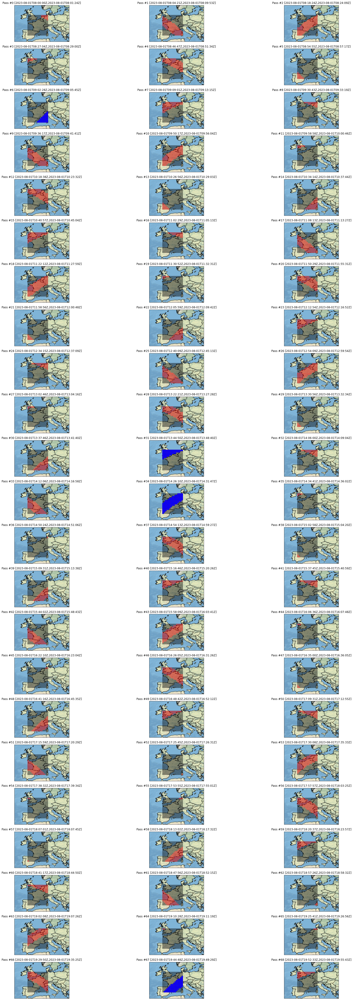

In [14]:
# import the solution
solutionFile = open('mySolution.json')  
solution = json.load(solutionFile)

showSolution(data,solution)

## Stage 3

EXPLAIN

In [135]:
# Import the data
dataFile = open('data/data4.json')  
data = json.load(dataFile)

# Load data
obsRequests = data['ObservationRequests']
fixedPassCost = data['fixedPassCost']
minVisiDuration = data['minVisiDuration']
aois = data['AOIs']
accesses = data['Accesses']
referenceDate = data['referenceDate']
passCostPerTimeUnit = data['passCostPerTimeUnit']
goals = data['Goals']
satPasses = data['Passes']

# Lengths of lists
nAois = len(aois)
nObsRequests = len(obsRequests)
nPasses = len(satPasses)
nGoals = len(goals)

# OPTIMISATION MODEL
# Model creation
model = Model("reactiveCovering")

# Variables
lbs = []
ubs = []

ube = []
lbe = []

for i in range(nPasses):
    lbs.append(satPasses[i]['start'])
    ubs.append(satPasses[i]['end']-30)
    
    lbe.append(satPasses[i]['start']+30)
    ube.append(satPasses[i]['end'])
    
selectedPass = model.binary_var_list(range(nPasses), name='selectedPass')
#tStart = model.continuous_var_list(range(nPasses), lb=lbs, ub=ubs, name='tStart')
#tEnd = model.continuous_var_list(range(nPasses), lb=lbe, ub=ube, name='tEnd')
tStart = model.continuous_var_list(range(nPasses), lb=lbs, name='tStart')
tEnd = model.continuous_var_list(range(nPasses), ub=ube, name='tEnd')

# Objectif:
# 1) Minimisation of the cost
model.minimize(model.sum(selectedPass)*data['fixedPassCost']
    + model.sum((tEnd[id] - tStart[id])*selectedPass[id] 
    for id in range(nPasses))*data['passCostPerTimeUnit'])

# Contraints:

const = 0
# AQUI FALLA, creo que en los <= y >=
for passId in range(nPasses):
    # 2) tStart constraint
    #model.add_constraint(tStart[passId] >= satPasses[passId]['start'])
    #model.add_constraint(tStart[passId] <= satPasses[passId]['end'])
    # 3) tEnd constraint
    #model.add_constraint(tEnd[passId] <= satPasses[passId]['end'])
    #model.add_constraint(tEnd[passId] >= satPasses[passId]['start'])
    # 4) (tEnd-tStart) >= 30s constraint
    model.add_constraint((tEnd[passId] - tStart[passId]) >= 30)
    
# 1) Ensuring that all the goals are covered bu at least one access of a pass
def accessing(requestStart, requestEnd, passId, obsReqId):
    if any(accessIdObsReq in satPasses[passId]['accessIds'] for accessIdObsReq in obsRequests[obsReqId]['accessIds']):
        #print('Access of the observation request in the pass {0}'.format(passId))
        if requestStart<=(satPasses[passId]['end'] - 30) and requestEnd>=(satPasses[passId]['start'] + 30):
            return selectedPass[passId]
    return 0
# Checking for all the observation requests

for aoiId in range(nAois):
    aux = 0
    for goalId in range(nGoals):
        for step in range(goals[goalId]['nSteps']):
            obsReqId = aoiId + nAois*aux + step + (goals[goalId]['nSteps'] - 1)*aoiId
            requestStart = step*goals[goalId]['duStep']
            requestEnd = step*goals[goalId]['duStep'] + goals[goalId]['rctHorizon']
            if (-requestStart+requestEnd) <= 30:
                print(-requestStart+requestEnd)
            print('Observation request ID:{0} for the Aoi {1} and the step {2} goal {3}'.format(obsReqId, aoiId, step, goalId))
            
            #print('Aoi {0}'.format(obsRequests[obsReqId]['aoiId']))
            #print('Goal of the observation request:' + str(obsRequests[obsReqId]['goalId']))
            #print('Step of the goal:' + str(step) + ' Starting @ ' + str(requestStart) + ' Ending @ ' +  str(requestEnd))
            accessings = [accessing(requestStart, requestEnd, passId, obsReqId) for passId in range(nPasses)]
            sum_accessing = model.sum(accessings)
            if not str(sum_accessing) == "0":
                # 1) Ensuring that all the goals are accessed
                model.add_constraint(sum_accessing >= 1)
                for passId in range(nPasses):
                    if not str(accessings[passId]) == "0":
                        # 2) tStart covering constraint
                        #model.add_constraint(requestStart <= tStart[passId])
                        model.add_constraint(requestStart <= tEnd[passId]-30)
                        # 3) tEnd covering constraint
                        #model.add_constraint(requestEnd >= tEnd[passId])
                        model.add_constraint(requestEnd >= tStart[passId]+30)
                        
            print('----------------------------------------------------------------------')
        aux += goals[goalId]['nSteps']


# Solve
# Time limitation
model.set_time_limit(60)

model.print_information()

# Call of the solver
solution = model.solve(log_output=True)

# solution.display()

# Getting the solution
selectedPassIds = []
if solution is None:
    raise Exception("No solution")
else:
    for i in range(nPasses):
        if selectedPass[i].solution_value == 1:
            selectedPassIds.append(i)
            
print('______________________________________________')
for i in selectedPassIds:
    print(i, tEnd[i].solution_value - tStart[i].solution_value)
print('______________________________________________')

# Computation of the total cost
timeUses = [tEnd[id].solution_value - tStart[id].solution_value for id in selectedPassIds]
totalCost = len(selectedPassIds)*data['fixedPassCost'] + model.sum(timeUses)*data['passCostPerTimeUnit']

# Computation of the quality of the covering: It is defined as the relation of the 
# requests covered over the total amount of requests
quality = 0
for aoiId in range(nAois):
    aux = 0
    for goalId in range(nGoals):
        for step in range(goals[goalId]['nSteps']):
            obsReqId = aoiId + nAois*aux + step + (goals[goalId]['nSteps'] - 1)*aoiId
            requestStart = step*goals[goalId]['duStep']
            requestEnd = step*goals[goalId]['duStep'] + goals[goalId]['rctHorizon']
            for passId in selectedPassIds:
                if any(accessIdObsReq in satPasses[passId]['accessIds'] for accessIdObsReq in obsRequests[obsReqId]['accessIds']):
                    if requestStart<=satPasses[passId]['start'] and requestEnd>=satPasses[passId]['end']:
                        quality +=1
                        break
        aux += goals[goalId]['nSteps']
        
quality /= nObsRequests

# Presentation of the results
print("IDs of the {0} selected passes: {1}".format(len(selectedPassIds), selectedPassIds))
print("Total cost of the covering: {0}".format(totalCost))
print("Quality of the covering: {0}".format(quality))

# export the solution to json
bookings = []
for i in selectedPassIds:
    satPass = satPasses[i]
    bookings.append({"passId": i, "passStart": satPass['start'], "passEnd": satPass['end'], "bookingStart": tStart[i].solution_value, "bookingEnd": tEnd[i].solution_value})
jsonString = json.dumps({"Bookings": bookings})
jsonFile = open("mySolution.json", "w")
jsonFile.write(jsonString)
jsonFile.close()

Observation request ID:0 for the Aoi 0 and the step 0 goal 0
----------------------------------------------------------------------
Observation request ID:225 for the Aoi 0 and the step 0 goal 1
----------------------------------------------------------------------
Observation request ID:226 for the Aoi 0 and the step 1 goal 1
----------------------------------------------------------------------
Observation request ID:227 for the Aoi 0 and the step 2 goal 1
----------------------------------------------------------------------
Observation request ID:228 for the Aoi 0 and the step 3 goal 1
----------------------------------------------------------------------
Observation request ID:229 for the Aoi 0 and the step 4 goal 1
----------------------------------------------------------------------
Observation request ID:230 for the Aoi 0 and the step 5 goal 1
----------------------------------------------------------------------
Observation request ID:231 for the Aoi 0 and the step 6 goal 1
-

----------------------------------------------------------------------
Observation request ID:476 for the Aoi 27 and the step 8 goal 1
----------------------------------------------------------------------
Observation request ID:28 for the Aoi 28 and the step 0 goal 0
----------------------------------------------------------------------
Observation request ID:477 for the Aoi 28 and the step 0 goal 1
----------------------------------------------------------------------
Observation request ID:478 for the Aoi 28 and the step 1 goal 1
----------------------------------------------------------------------
Observation request ID:479 for the Aoi 28 and the step 2 goal 1
----------------------------------------------------------------------
Observation request ID:480 for the Aoi 28 and the step 3 goal 1
----------------------------------------------------------------------
Observation request ID:481 for the Aoi 28 and the step 4 goal 1
--------------------------------------------------------

----------------------------------------------------------------------
Observation request ID:729 for the Aoi 56 and the step 0 goal 1
----------------------------------------------------------------------
Observation request ID:730 for the Aoi 56 and the step 1 goal 1
----------------------------------------------------------------------
Observation request ID:731 for the Aoi 56 and the step 2 goal 1
----------------------------------------------------------------------
Observation request ID:732 for the Aoi 56 and the step 3 goal 1
----------------------------------------------------------------------
Observation request ID:733 for the Aoi 56 and the step 4 goal 1
----------------------------------------------------------------------
Observation request ID:734 for the Aoi 56 and the step 5 goal 1
----------------------------------------------------------------------
Observation request ID:735 for the Aoi 56 and the step 6 goal 1
-------------------------------------------------------

----------------------------------------------------------------------
Observation request ID:989 for the Aoi 84 and the step 8 goal 1
----------------------------------------------------------------------
Observation request ID:85 for the Aoi 85 and the step 0 goal 0
----------------------------------------------------------------------
Observation request ID:990 for the Aoi 85 and the step 0 goal 1
----------------------------------------------------------------------
Observation request ID:991 for the Aoi 85 and the step 1 goal 1
----------------------------------------------------------------------
Observation request ID:992 for the Aoi 85 and the step 2 goal 1
----------------------------------------------------------------------
Observation request ID:993 for the Aoi 85 and the step 3 goal 1
----------------------------------------------------------------------
Observation request ID:994 for the Aoi 85 and the step 4 goal 1
--------------------------------------------------------

----------------------------------------------------------------------
Observation request ID:1235 for the Aoi 112 and the step 2 goal 1
----------------------------------------------------------------------
Observation request ID:1236 for the Aoi 112 and the step 3 goal 1
----------------------------------------------------------------------
Observation request ID:1237 for the Aoi 112 and the step 4 goal 1
----------------------------------------------------------------------
Observation request ID:1238 for the Aoi 112 and the step 5 goal 1
----------------------------------------------------------------------
Observation request ID:1239 for the Aoi 112 and the step 6 goal 1
----------------------------------------------------------------------
Observation request ID:1240 for the Aoi 112 and the step 7 goal 1
----------------------------------------------------------------------
Observation request ID:1241 for the Aoi 112 and the step 8 goal 1
-----------------------------------------

----------------------------------------------------------------------
Observation request ID:1472 for the Aoi 138 and the step 5 goal 1
----------------------------------------------------------------------
Observation request ID:1473 for the Aoi 138 and the step 6 goal 1
----------------------------------------------------------------------
Observation request ID:1474 for the Aoi 138 and the step 7 goal 1
----------------------------------------------------------------------
Observation request ID:1475 for the Aoi 138 and the step 8 goal 1
----------------------------------------------------------------------
Observation request ID:139 for the Aoi 139 and the step 0 goal 0
----------------------------------------------------------------------
Observation request ID:1476 for the Aoi 139 and the step 0 goal 1
----------------------------------------------------------------------
Observation request ID:1477 for the Aoi 139 and the step 1 goal 1
------------------------------------------

----------------------------------------------------------------------
Observation request ID:1701 for the Aoi 164 and the step 0 goal 1
----------------------------------------------------------------------
Observation request ID:1702 for the Aoi 164 and the step 1 goal 1
----------------------------------------------------------------------
Observation request ID:1703 for the Aoi 164 and the step 2 goal 1
----------------------------------------------------------------------
Observation request ID:1704 for the Aoi 164 and the step 3 goal 1
----------------------------------------------------------------------
Observation request ID:1705 for the Aoi 164 and the step 4 goal 1
----------------------------------------------------------------------
Observation request ID:1706 for the Aoi 164 and the step 5 goal 1
----------------------------------------------------------------------
Observation request ID:1707 for the Aoi 164 and the step 6 goal 1
-----------------------------------------

----------------------------------------------------------------------
Observation request ID:1956 for the Aoi 192 and the step 3 goal 1
----------------------------------------------------------------------
Observation request ID:1957 for the Aoi 192 and the step 4 goal 1
----------------------------------------------------------------------
Observation request ID:1958 for the Aoi 192 and the step 5 goal 1
----------------------------------------------------------------------
Observation request ID:1959 for the Aoi 192 and the step 6 goal 1
----------------------------------------------------------------------
Observation request ID:1960 for the Aoi 192 and the step 7 goal 1
----------------------------------------------------------------------
Observation request ID:1961 for the Aoi 192 and the step 8 goal 1
----------------------------------------------------------------------
Observation request ID:193 for the Aoi 193 and the step 0 goal 0
------------------------------------------

----------------------------------------------------------------------
Observation request ID:2213 for the Aoi 220 and the step 8 goal 1
----------------------------------------------------------------------
Observation request ID:221 for the Aoi 221 and the step 0 goal 0
----------------------------------------------------------------------
Observation request ID:2214 for the Aoi 221 and the step 0 goal 1
----------------------------------------------------------------------
Observation request ID:2215 for the Aoi 221 and the step 1 goal 1
----------------------------------------------------------------------
Observation request ID:2216 for the Aoi 221 and the step 2 goal 1
----------------------------------------------------------------------
Observation request ID:2217 for the Aoi 221 and the step 3 goal 1
----------------------------------------------------------------------
Observation request ID:2218 for the Aoi 221 and the step 4 goal 1
------------------------------------------


Flow cuts applied:  8
Mixed integer rounding cuts applied:  19
Gomory fractional cuts applied:  4

Root node processing (before b&c):
  Real time             =    0.08 sec. (50.24 ticks)
Parallel b&c, 16 threads:
  Real time             =    0.00 sec. (0.00 ticks)
  Sync time (average)   =    0.00 sec.
  Wait time (average)   =    0.00 sec.
                          ------------
Total (root+branch&cut) =    0.08 sec. (50.24 ticks)
______________________________________________
2 30.0
7 30.0
13 30.0
14 30.0
17 30.0
18 30.0
20 30.0
21 60.0
22 30.0
23 30.0
25 30.0
26 30.0
29 30.0
30 30.0
33 30.0
34 30.0
37 30.0
47 30.0
48 30.0
49 30.0
51 30.0
52 30.0
53 30.0
56 30.0
58 30.0
61 30.0
62 30.0
66 30.0
______________________________________________
IDs of the 28 selected passes: [2, 7, 13, 14, 17, 18, 20, 21, 22, 23, 25, 26, 29, 30, 33, 34, 37, 47, 48, 49, 51, 52, 53, 56, 58, 61, 62, 66]
Total cost of the covering: 4230
Quality of the covering: 0.9924444444444445


Bookings:
{'passId': 2, 'passStart': 1104, 'passEnd': 1449, 'bookingStart': 1104.0, 'bookingEnd': 1134.0}
{'passId': 7, 'passStart': 4141, 'passEnd': 4395, 'bookingStart': 4140.999999999997, 'bookingEnd': 4170.999999999997}
{'passId': 13, 'passStart': 8816, 'passEnd': 8943, 'bookingStart': 8816.0, 'bookingEnd': 8846.0}
{'passId': 14, 'passStart': 9254, 'passEnd': 9464, 'bookingStart': 9254.0, 'bookingEnd': 9284.0}
{'passId': 17, 'passStart': 11293, 'passEnd': 11607, 'bookingStart': 11293.0, 'bookingEnd': 11323.0}
{'passId': 18, 'passStart': 12132, 'passEnd': 12479, 'bookingStart': 12132.0, 'bookingEnd': 12162.0}
{'passId': 20, 'passStart': 13829, 'passEnd': 14131, 'bookingStart': 14101.00000000001, 'bookingEnd': 14131.00000000001}
{'passId': 21, 'passStart': 14336, 'passEnd': 14448, 'bookingStart': 14370.0, 'bookingEnd': 14430.0}
{'passId': 22, 'passStart': 14759, 'passEnd': 14982, 'bookingStart': 14759.0, 'bookingEnd': 14789.0}
{'passId': 23, 'passStart': 15174, 'passEnd': 15412, 'boo

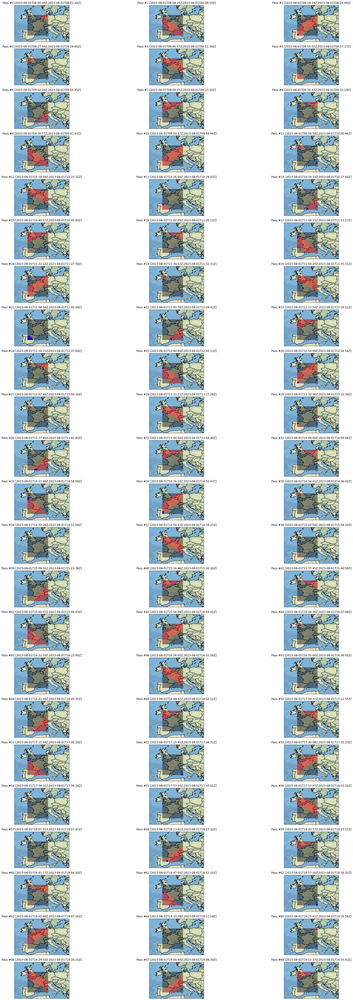

In [136]:
# import the solution
solutionFile = open('mySolution.json')  
solution = json.load(solutionFile)

showSolution(data,solution)